In [1]:
import numpy as np
from matplotlib import pyplot as plt

from astropy.io import fits
from astropy.modeling import models, fitting
from photutils.centroids import centroid_com
from photutils.aperture import CircularAperture
from photutils.aperture import aperture_photometry

%matplotlib inline
%config InlineBackend.figure_format='retina'
#!pip install git+https://github.com/M-Bianchi/My_matplotlib_style
plt.style.use('mystyle')
plt.rcParams['axes.grid'] = False

In [2]:
# Function to open the fits file and plot them
def Open_Fits(filepath, plot, cmap='gnuplot2'):
    file_temp = fits.open(filepath)
    file = file_temp[0].data
    file_temp.close()
    if plot == True:
        plt.imshow(file, clim=(0, np.quantile(file, [0.99])), cmap=cmap, origin='lower')
        plt.colorbar(fraction=0.0375, pad=0.02);
    return file

$m_\text{physical} = \text{ZP} + m_\text{instrument}$

$-2.5 \log_{10} f_\lambda = \text{ZP} - 2.5 \log_{10} R[e^-/s] \:\:\: \Longrightarrow \:\:\: f_\lambda [erg/s/cm^2/\AA] = 10^{-0.4 \text{ZP}} R[e^-/s]$ 

In order to obtain ZP, we have to estimate $m_\text{physical}$ from calibration stars. We use the SDSS catalogue.

TOBI_ha = SDSS_r -0.2568 * (SDSS_g-SDSS_r) + 0.1470

TOBI_hb =  SDSS_g -0.2322 * (SDSS_g-SDSS_r) + -0.0024

TOBI_g   = SDSS_g -0.1205 * (SDSS_g-SDSS_r) + 0.0012

TOBI_r    = SDSS_r -0.0061 * (SDSS_g-SDSS_r) + 0.0001

TOBI_i    = SDSS_i -0.0609 * (SDSS_r-SDSS_i) + 0.0049


In [1]:
def ZeroPoint (philter, ourflux):
    if philter == 'Ha':
        Tobi = stars_rmag -0.2568 * (stars_gmag-stars_rmag) + 0.1470
    elif philter == 'Hb':
        Tobi = stars_gmag -0.2322 * (stars_gmag-stars_rmag) + -0.0024  #??? + o - ?
    elif philter == 'g':
        Tobi = stars_gmag -0.1205 * (stars_gmag-stars_rmag) + 0.0012
    elif philter == 'r':
        Tobi = stars_rmag -0.0061 * (stars_gmag-stars_rmag) + 0.0001
    elif philter == 'i':
        Tobi = stars_imag -0.0609 * (stars_rmag-stars_imag) + 0.0049

    return np.mean(ourflux - Tobi)

# SDSS catalog comparison

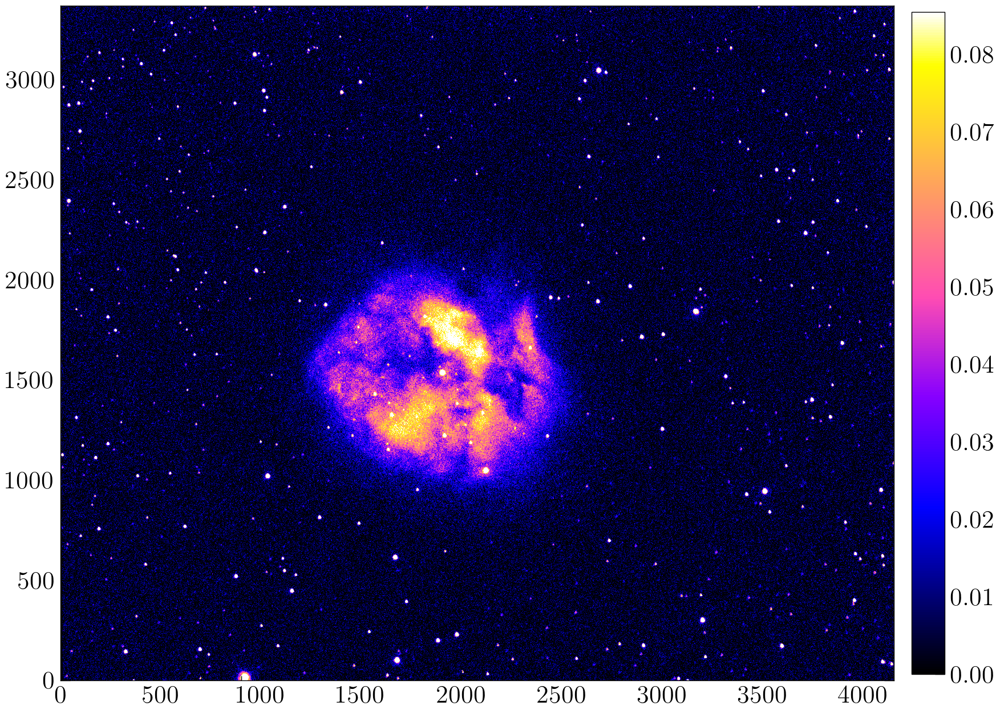

In [3]:
final_Ha = Open_Fits(filepath='Data/final_Ha.fits', plot=True)

In [4]:
final_Ha_radec = fits.open('Data/final_Ha_radec.fits')[1].data
#final_Ha_radec

FITS_rec([(328.6532846 , 47.15560772,  921.82434 , 1.74548531e+01, 3.45572052e+01, 0.00260925),
          (328.37017436, 47.26660542, 1907.9147  , 1.53818115e+03, 9.16756153e+00, 0.04750919),
          (328.12018925, 47.38700367, 2686.7764  , 3.04577710e+03, 7.69480991e+00, 0.0024128 ),
          (328.37558545, 47.2012023 , 2125.0745  , 1.04945142e+03, 6.86020613e+00, 0.02323532),
          (328.1420862 , 47.22878445, 3172.8506  , 1.84244763e+03, 6.70983076e+00, 0.00212526),
          (328.16143343, 47.1119084 , 3515.8984  , 9.45524536e+02, 4.97167635e+00, 0.0022378 ),
          (328.39010883, 47.49197238,  970.0183  , 3.12536255e+03, 3.22498703e+00, 0.00243759),
          (328.33571165, 47.44714909, 1404.0621  , 2.93674268e+03, 1.34269893e+00, 0.0023849 ),
          (328.52438474, 47.12269255, 1681.8555  , 1.02863037e+02, 5.45206022e+00, 0.00224209),
          (328.55278954, 47.25886365, 1036.0205  , 1.02124268e+03, 3.96849036e+00, 0.00243831),
          (328.26415876, 47.05925134, 32

In [5]:
print(np.min(final_Ha_radec['ra']), np.max(final_Ha_radec['ra']))
print(np.min(final_Ha_radec['dec']), np.max(final_Ha_radec['dec']))

327.861475729151 328.7958090865958
46.9823001142356 47.5606852155633


In [6]:
# magnitudes between 14.5 and 15.5
SDSS_catalogue = fits.open('Data/SDSS_catalogue.fit')[1].data
#SDSS_catalogue

FITS_rec([(328.67847083, 46.98288251, 328.67849, 46.98289, 1, '', 6, 'J215442.83+465858.4', '*', 2006.394, 1, 15.734, 0.007, 15.258, 0.011, 14.612, 0.01, 15.003, 0.012, 13.063, 0.007, 0.0, 0.0, 0.0, 0.0),
          (328.65387555, 46.99905708, 328.653844, 46.999018, 1, '', 6, 'J215436.92+465956.4', '', 2006.394, 1, 16.595, 0.008, 14.685, 0.003, 14.517, 0.01, 15.592, 0.013, 12.922, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.42511141, 47.00165444, 328.425113, 47.001658, 1, '', 6, 'J215342.02+470005.9', '*', 2006.394, 3, 17.761, 0.014, 15.222, 0.004, 14.573, 0.011, 12.816, 0.001, 12.866, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.57290232, 47.09595986, 328.572934, 47.095973, 1, '', 6, 'J215417.50+470545.5', '', 2006.394, 3, 17.066, 0.009, 15.248, 0.003, 14.606, 0.003, 15.174, 0.012, 14.257, 0.005, 0.0, 0.0, 0.0, 0.0),
          (328.57496658, 47.07762635, 328.574976, 47.07764, 1, '', 6, 'J215417.99+470439.5', '', 2006.394, 3, 16.469, 0.007, 15.086, 0.003, 14.74, 0.003, 14.579, 0.004, 14.43

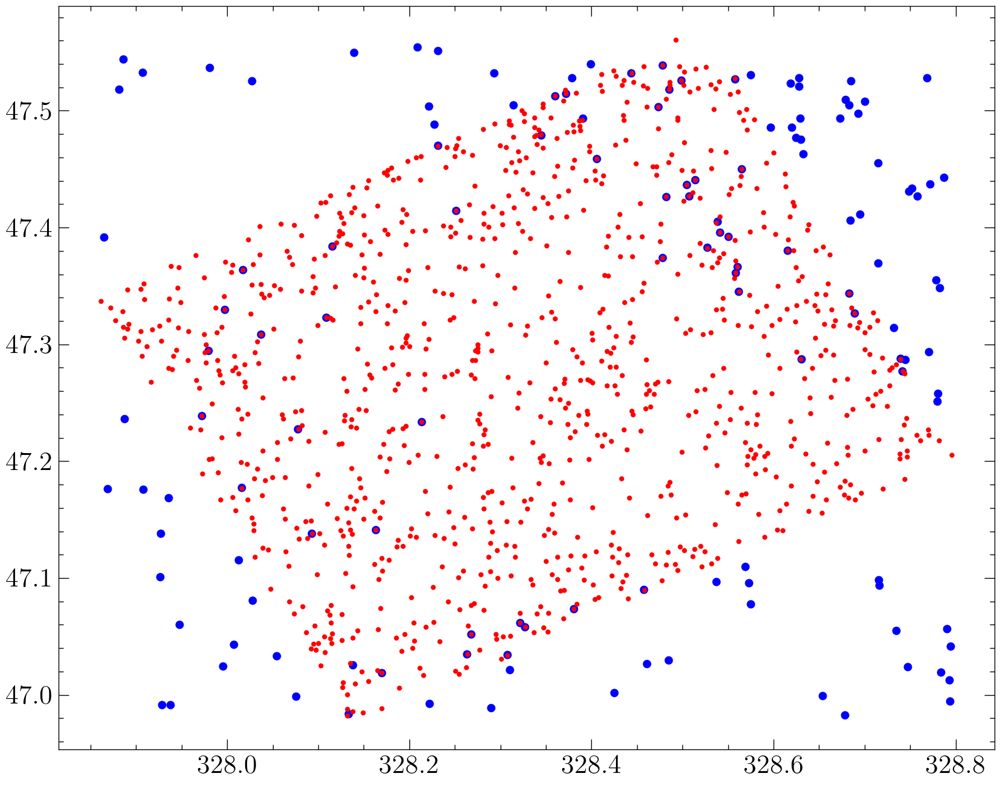

In [7]:
for i in range(len(SDSS_catalogue['_RAJ2000'])):
    plt.plot(SDSS_catalogue['_RAJ2000'][i], SDSS_catalogue['_DEJ2000'][i], c='blue', marker='o', markersize=4)

for i in range(len(final_Ha_radec['ra'])):
    plt.plot(final_Ha_radec['ra'][i], final_Ha_radec['dec'][i], c='red', marker='o', markersize=2)

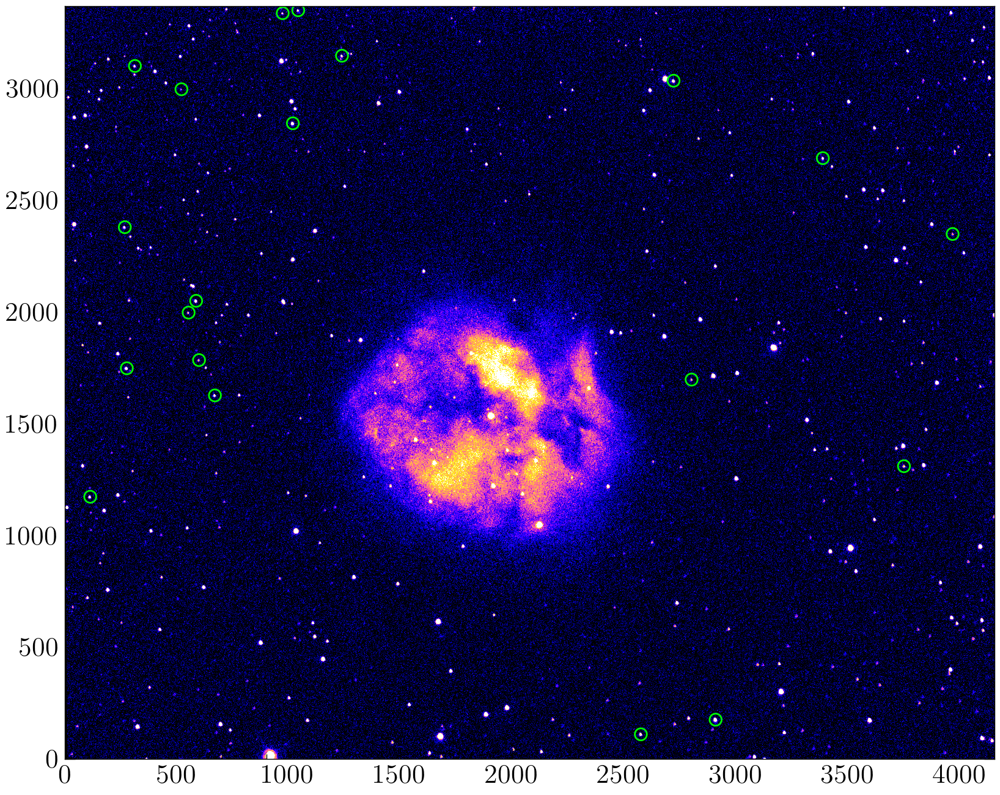

In [ ]:
stars_x = []
stars_y = []
stars_gmag = []
stars_rmag = []
stars_imag = []

for i in range(len(SDSS_catalogue['_RAJ2000'])):
    # Find the matches between SDSS stars and our stars
    mask_ra = np.isclose(final_Ha_radec['ra'], SDSS_catalogue['_RAJ2000'][i], atol=0, rtol=0.000001)
    mask_dec = np.isclose(final_Ha_radec['dec'], SDSS_catalogue['_DEJ2000'][i], atol=0, rtol=0.000001)
    mask_tot = np.logical_and(mask_ra, mask_dec)
    
    # If there is only one match, append the coordinates (from astrometry.net) and magnitudes (from SDSS catalogue)
    # If there is no match or more than one match, do nothing
    if np.sum(mask_tot) == 1:
        stars_x.append(final_Ha_radec['x'][mask_tot][0])
        stars_y.append(final_Ha_radec['y'][mask_tot][0])
        stars_gmag.append(SDSS_catalogue['gmag'][i])
        stars_rmag.append(SDSS_catalogue['rmag'][i])
        stars_imag.append(SDSS_catalogue['imag'][i])
        
        
plt.imshow(final_Ha, clim=(0, np.quantile(final_Ha, [0.99])), cmap='gnuplot2', origin='lower')

for i in range(len(stars_x)):
    plt.scatter(stars_x[i], stars_y[i], facecolors='none', edgecolors='lime', s=50)

In [ ]:
def Aperture_Photometry(image, stars_x, stars_y, rectangle_side=40):
    ourfluxes = []

    fig, ax = plt.subplots()
    ax.imshow(image, clim=(0, np.quantile(image, [0.99])), cmap='gnuplot2', origin='lower')

    for i in range(len(stars_x)):
        # Determine the centroids of the stars (more accurate than the astrometry.net ones)
        cutout = image[round(stars_y[i])-round(rectangle_side/2):round(stars_y[i])+round(rectangle_side/2), round(stars_x[i])-round(rectangle_side/2):round(stars_x[i])+round(rectangle_side/2)]
        centroid = centroid_com(cutout)+[round(stars_x[i])-round(rectangle_side/2), round(stars_y[i])-round(rectangle_side/2)]

        if np.isnan(centroid).any() == True:
            print('The centroid algorithm returned NaN. The corresponding star will have a NaN flux.')
            ourfluxes.append(np.nan)
            continue
        
        rectangle_plot = plt.Rectangle(centroid-[round(rectangle_side/2),round(rectangle_side/2)], rectangle_side, rectangle_side, linewidth=0.8, color='lime', fill=False)
        ax.add_patch(rectangle_plot)

        # Compute the FWHM of the stars to decide the radius of the circular aperture
        cutout = image[round(centroid[1])-round(rectangle_side/2):round(centroid[1])+round(rectangle_side/2), round(centroid[0])-round(rectangle_side/2):round(centroid[0])+round(rectangle_side/2)]
        x_projection = np.mean(cutout, axis=0)
        x_fit = np.arange(len(x_projection))
        gaussian = models.Gaussian1D(amplitude=np.max(x_projection), mean=len(x_projection)/2, stddev=len(x_projection)/10)
        fit_gaussian = fitting.LevMarLSQFitter()
        fitted_gaussian = fit_gaussian(gaussian, x_fit, x_projection)
        fwhm = 2.355*fitted_gaussian.stddev

        # Compute the flux of the stars
        aperture = CircularAperture(centroid, r=3*fwhm)
        ourfluxes.append(aperture_photometry(image, aperture)['aperture_sum'][0])

    print(ourfluxes)
    
    return ourfluxes

# Filter Ha

In [ ]:
ourfluxes_Ha = Aperture_Photometry(final_Ha, stars_x, stars_y)

ZP_Ha = ZeroPoint(philter='Ha',ourfluxes_Ha)

# Filter Hb

[12.069801992865607, 28.648858704977698, 8.018281560116694, 7.107020532405328, 18.20386068026803, 6.9784894900086485, 46.93304553753761, 16.871444405735424, 11.933362160689965, 5.9103198316503445, 37.68119614904681, 7.607071800853493, 38.08609611776415, 17.189556567735025, 67.17306989829419, 12.649510889880215, 6.593803659313311, 20.226224695889456, 11.4149927888986, 6.6094300139297975]


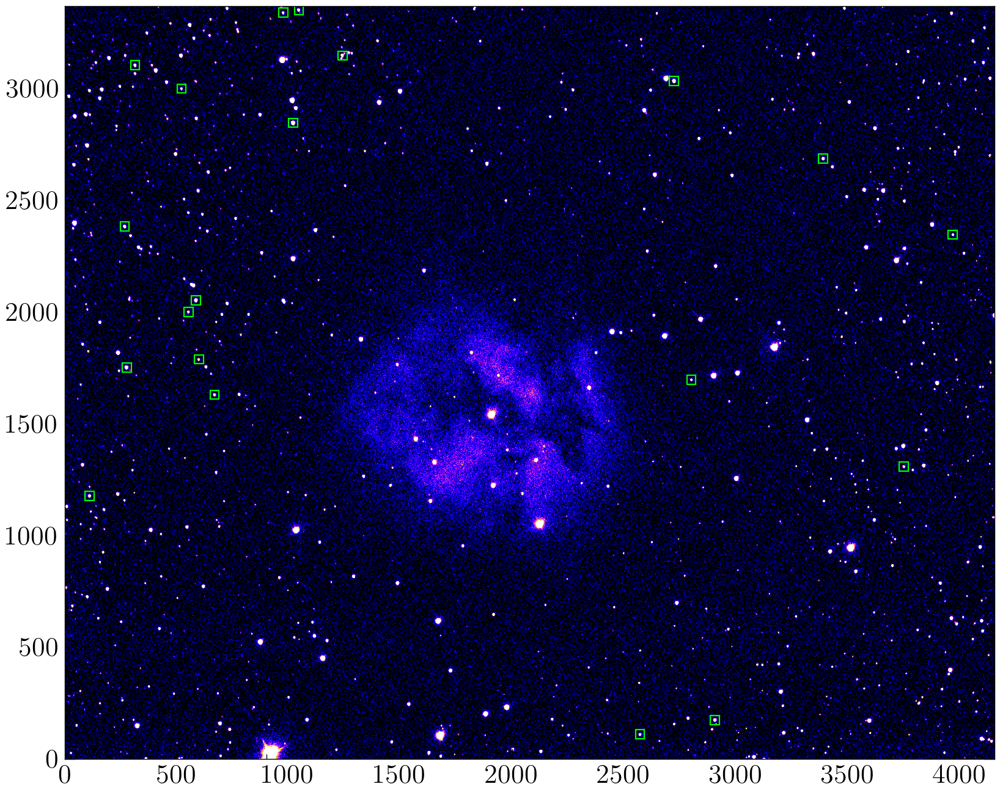

In [11]:
final_Hb = Open_Fits(filepath='Data/final_Hb.fits', plot=False)

ourfluxes_Hb = Aperture_Photometry(final_Hb, stars_x, stars_y)

ZP_Hb = ZeroPoint(philter='Hb',ourfluxes_Hb)

# Filter g

[348.66142530036063, 816.5830311350691, 233.3326913838694, 217.15204218017723, 464.67033230627897, 184.140981558639, 1277.601015283949, 430.59062813869184, 341.46602505661974, 173.35247811053964, 1060.0256089143993, 200.78465896736137, 1031.573057244024, 484.74531263035044, 1768.3495482338533, 360.5964909466561, 153.476049311773, 536.5758849980704, 362.43351586251174, 192.30884279989988]


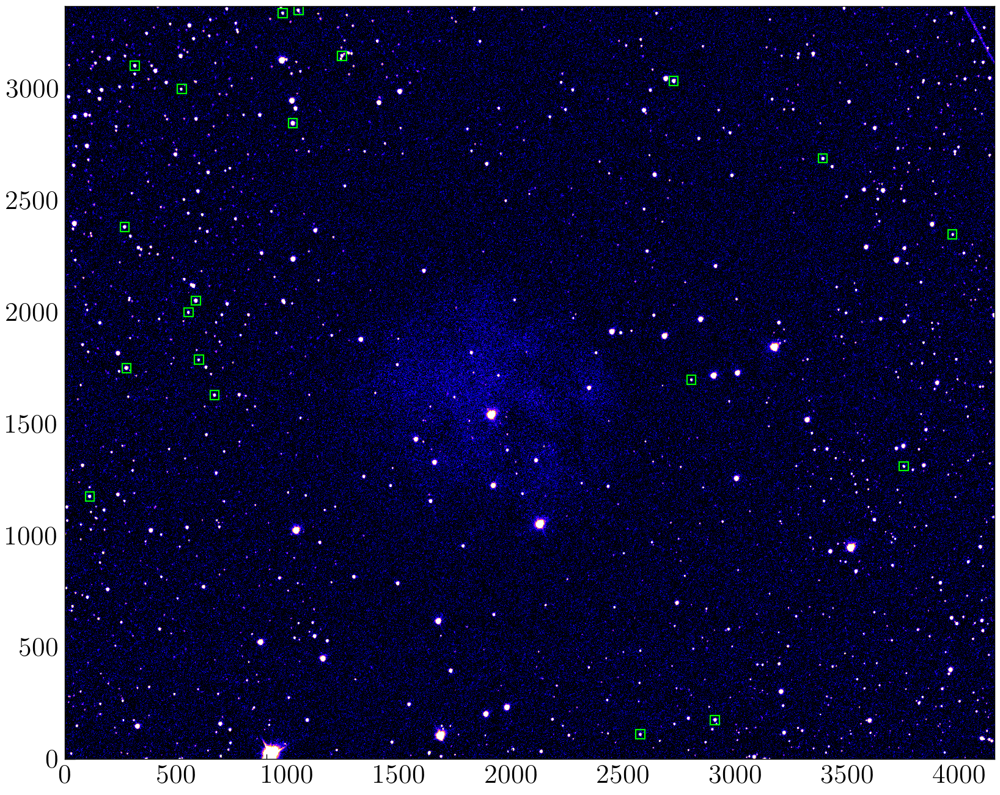

In [12]:
final_g = Open_Fits(filepath='Data/final_g.fits', plot=False)

ourfluxes_g = Aperture_Photometry(final_g, stars_x, stars_y)

ZP_g = ZeroPoint(philter='g',ourfluxes_g)

# Filter r

[823.995191593654, 2708.0259182074565, 429.19344647184636, 311.62958934151595, 765.7506348549412, 316.08399307111847, 1810.249783774615, 750.9234530640847, 720.5462728003481, 257.2403346921249, 1489.9826211598677, 286.8582310285881, 1488.9867716645233, 827.775781237912, 2426.0835425200185, 563.2592232990005, 186.06870797527182, 827.8949501784873, 510.1092410536746, 297.3134721430728]


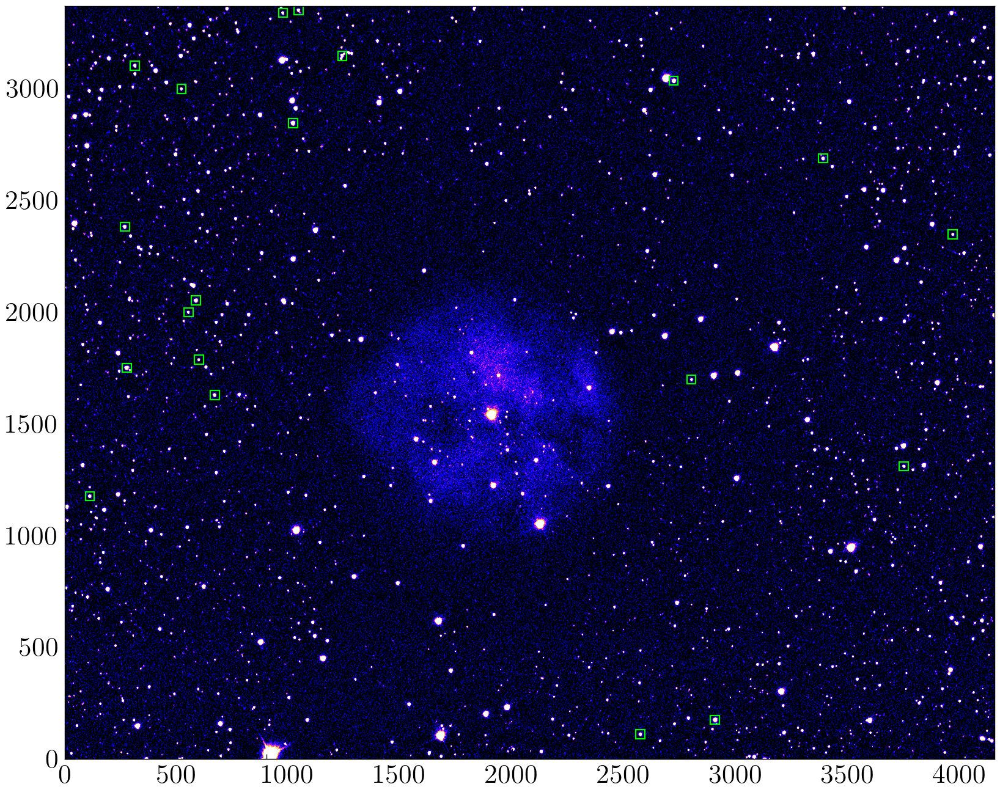

In [13]:
final_r = Open_Fits(filepath='Data/final_r.fits', plot=False)

ourfluxes_r = Aperture_Photometry(final_r, stars_x, stars_y)

ZP_r = ZeroPoint(philter='r',ourfluxes_r)

# Filter i

[824.0775430200588, 2691.664630371137, 420.4148440179669, 323.38383447522403, 744.5252953137727, 302.5839930243519, 1804.352188104287, 747.9698412737118, 714.1071736738995, 283.14020734821185, 1491.3429936570833, 289.85688025253955, 1496.870490469485, 842.3320391722559, 2425.9651378200033, 559.4062226189891, 246.4190582677975, 840.9070826575361, 514.0946728889926, 311.3210196730895]


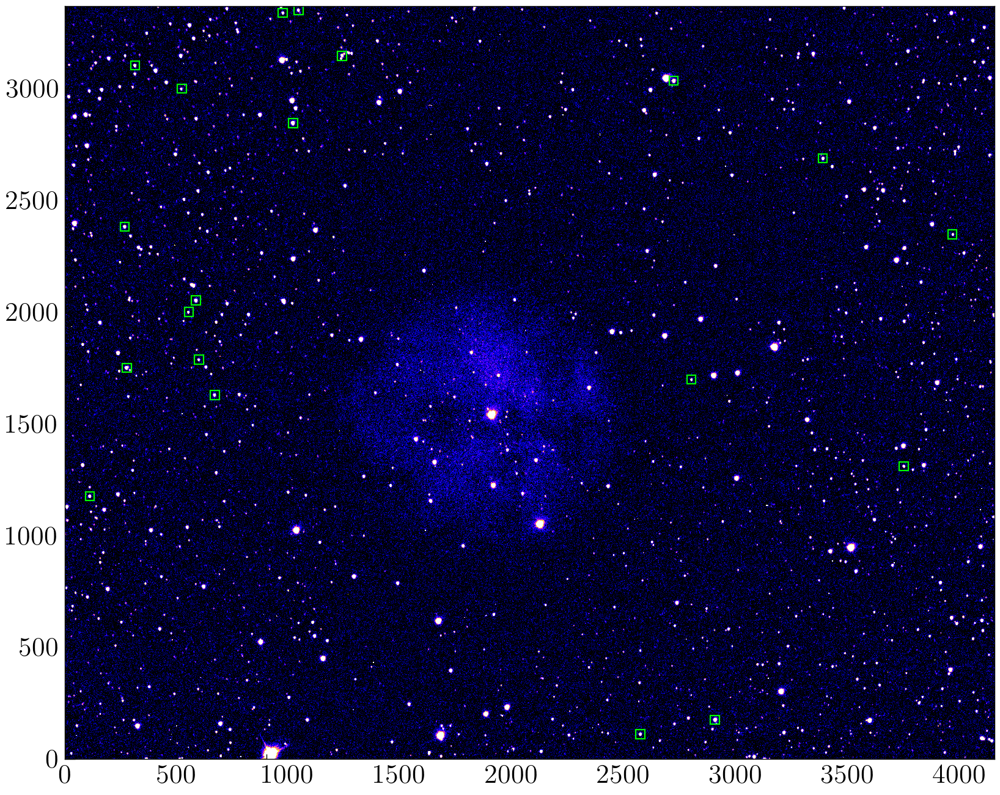

In [14]:
final_i = Open_Fits(filepath='Data/final_i.fits', plot=False)

ourfluxes_i = Aperture_Photometry(final_i, stars_x, stars_y)

ZP_i = ZeroPoint(philter='i',ourfluxes_i)